In [1]:
import cv2
import os
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings('ignore')

import sklearn.metrics
from google.colab.patches import cv2_imshow
from skimage.segmentation import felzenszwalb, slic, quickshift, watershed
from skimage.segmentation import mark_boundaries
from skimage.filters import sobel
from skimage.color import rgb2gray

import pickle

In [2]:
from google.colab import drive
drive.mount('/content/drive/')

os.chdir('/content/drive/My Drive/Ring_sample_data')

Mounted at /content/drive/


In [11]:
# img=cv2.imread('s92.PNG',1)
# img=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# gray=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

In [143]:
# hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
# lower_gold = np.array([20, 100, 100])
# upper_gold = np.array([30, 255, 255])

# lower_diamond = np.array([0, 0, 200])
# upper_diamond = np.array([180, 50, 255])

# mask_gold = cv2.inRange(hsv, lower_gold, upper_gold)
# mask_diamond = cv2.inRange(hsv, lower_diamond, upper_diamond)

# mask_combined = cv2.bitwise_or(mask_gold, mask_diamond)

# result = cv2.bitwise_and(img, img, mask=mask_combined)

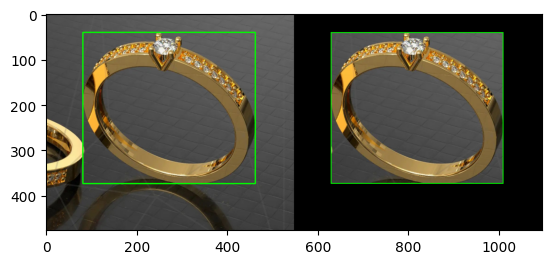

In [247]:
# edges=cv2.Canny(gray,threshold1=127,threshold2=127)
# kernel = np.ones((5, 5), np.uint8)
# result = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)
# # gray_result = cv2.cvtColor(result, cv2.COLOR_BGR2GRAY)

# contours, hierarchy = cv2.findContours(result, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# mask = np.zeros_like(img)

# largest_contour = max(contours, key=cv2.contourArea)
# # hull = cv2.convexHull(largest_contour)
# x, y, w, h = cv2.boundingRect(largest_contour)
# cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
# cv2.rectangle(mask, (x, y), (x + w, y + h), (255, 255, 255), -1)
# masked_image = cv2.bitwise_and(img, mask)
# output=np.hstack([img,masked_image])


# plt.imshow(output)
# plt.show()

In [ ]:
# coordinates = []
# with open('s92.txt', 'r') as file:
#   for line in file:
#     class_id, x_center, y_center, width, height = map(float, line.strip().split())
#     coordinates.append((x_center,y_center))

# img_height, img_width = gray.shape

# for x_center, y_center in coordinates:
#   x_center_pixel = int(x_center * img_width)
#   y_center_pixel = int(y_center * img_height)

#   gt_width = int(width * img_width)
#   gt_height = int(height * img_height)

#   gt_x = int(x_center_pixel - (gt_width / 2))
#   gt_y = int(y_center_pixel - (gt_height / 2))
#   cv2.rectangle(img, (gt_x, gt_y), (gt_x + gt_width, gt_y + gt_height), (0, 255, 0), 2)

# plt.imshow(img)

In [3]:
def bounding(img_path):
  img=cv2.imread(img_path,1)
  img=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  gray=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

  edges=cv2.Canny(gray,threshold1=127,threshold2=127)
  kernel = np.ones((5, 5), np.uint8)
  result = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)

  contours, hierarchy = cv2.findContours(result, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

  mask = np.zeros_like(img)

  largest_contour = max(contours, key=cv2.contourArea)
  x, y, w, h = cv2.boundingRect(largest_contour)
  cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
  cv2.rectangle(mask, (x, y), (x + w, y + h), (255, 255, 255), -1)
  masked_image = cv2.bitwise_and(img, mask)
  output=np.hstack([img,masked_image])

  return x,y,x+w,y+h,output

In [4]:
def ground_truth(txt_path,img_path):
  coordinates = []
  with open(txt_path, 'r') as file:
    for line in file:
      class_id, x_center, y_center, width, height = map(float, line.strip().split())
      coordinates.append((x_center,y_center))

  img=cv2.imread(img_path,1)
  gray=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  img_height, img_width = gray.shape

  for x_center, y_center in coordinates:
    x_center_pixel = int(x_center * img_width)
    y_center_pixel = int(y_center * img_height)

    gt_width = int(width * img_width)
    gt_height = int(height * img_height)

    gt_x = int(x_center_pixel - (gt_width / 2))
    gt_y = int(y_center_pixel - (gt_height / 2))
    # cv2.rectangle(img, (gt_x, gt_y), (gt_x + gt_width, gt_y + gt_height), (0, 255, 0), 2)
    gt_x1=gt_x+gt_width
    gt_y1=gt_y+gt_height
    return gt_x,gt_y,gt_x1,gt_y1

In [5]:
def intersection_over_union(gt, pred):
    xA = max(gt[0], pred[0])
    yA = max(gt[1], pred[1])
    xB = min(gt[2], pred[2])
    yB = min(gt[3], pred[3])
    # if there is no overlap between predicted and ground-truth box
    if xB < xA or yB < yA:
        return 0.0
    # compute the area of intersection rectangle
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
    # compute the area of both the prediction and ground-truth
    boxAArea = (gt[2] - gt[0] + 1) * (gt[3] - gt[1] + 1)
    boxBArea = (pred[2] - pred[0] + 1) * (pred[3] - pred[1] + 1)
    # compute the intersection over union by taking the intersection
    iou = interArea / float(boxAArea + boxBArea - interArea)
    return iou

In [12]:
def compute_iou(txt_path,img_path):
  img=cv2.imread(img_path)
  gt_x,gt_y,gt_x1,gt_y1=ground_truth(txt_path,img_path)
  groundTruth=[gt_x,gt_y,gt_x1,gt_y1]
  x,y,x1,y1,output=bounding(img_path)
  prediction=[x,y,x1,y1]

  cv2.rectangle(img, (groundTruth[:2]),(groundTruth[2:]), (0, 255, 0), 2)
  cv2.rectangle(img, (prediction[:2]),(prediction[2:]), (0, 0, 255), 2)

  iou = intersection_over_union(groundTruth, prediction)
  cv2.putText(img, "IoU: {:.4f}".format(iou), (10, 34),cv2.FONT_HERSHEY_SIMPLEX, 1.4, (0, 255, 0), 3)

  return iou, img

In [42]:
def process_images(iou_threshold=0,output_dir="output_images"):
    results = []

    os.makedirs(output_dir, exist_ok=True)

    for i in range(1, 101):
        txt_file = f"s{i}.txt"
        img_file = f"s{i}.PNG"

        if os.path.exists(txt_file) and os.path.exists(img_file):
            iou, iou_image = compute_iou(txt_file, img_file)
            x, y, x1, y1, bounding_box_image = bounding(img_file)

            iou_image_path = os.path.join(output_dir, f"iou_image_{i}.jpg")
            bounding_box_image_path = os.path.join(output_dir, f"bounding_box_image_{i}.jpg")

            cv2.imwrite(iou_image_path,iou_image)
            cv2.imwrite(bounding_box_image_path, bounding_box_image)

            results.append({
                'image_id': i,
                'iou': iou,
                'iou_image_path': iou_image_path,
                'bounding_box_image_path': bounding_box_image_path
            })

    # Calculate precision and recall
    true_positives = sum(1 for result in results if result['iou'] > iou_threshold)
    false_positives = len(results) - true_positives
    false_negatives = 0

    precision = true_positives / (true_positives + false_positives) if (true_positives + false_positives) else 0
    recall = true_positives / (true_positives + false_negatives) if (true_positives + false_negatives) else 0

    return results,precision, recall

In [43]:
results,precision, recall = process_images(output_dir="week 1 results")
print(precision,recall)

0.9278350515463918 1.0


In [44]:
results[0]['iou_image_path']

'week 1 results/iou_image_1.jpg'

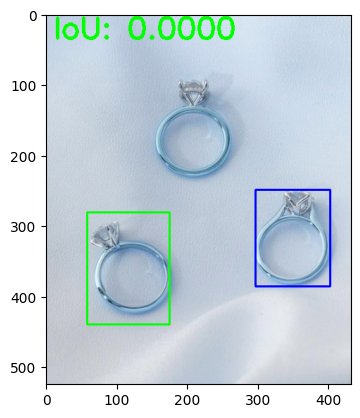

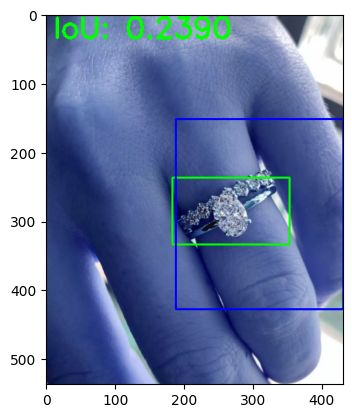

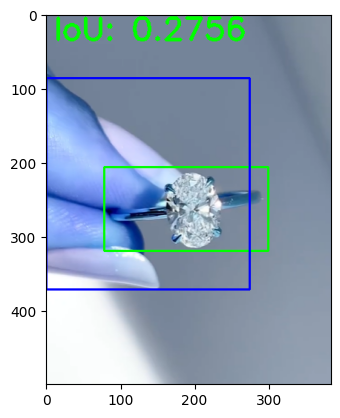

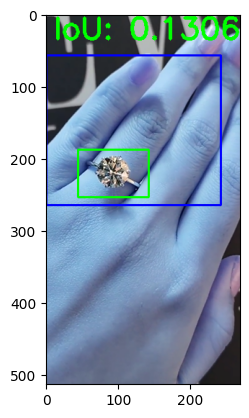

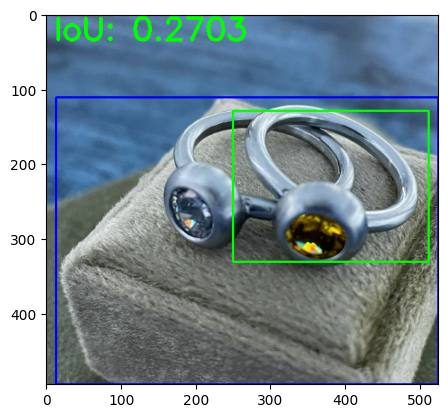

...

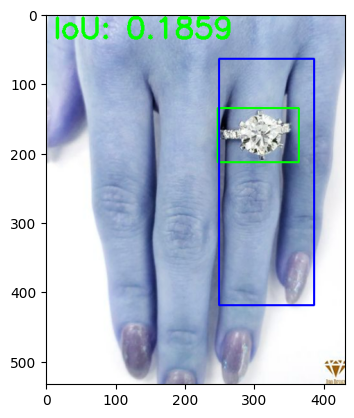

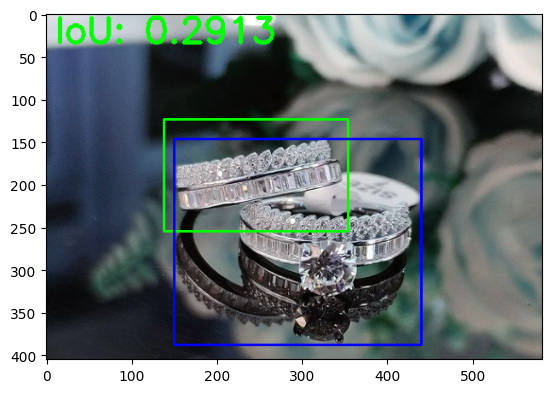

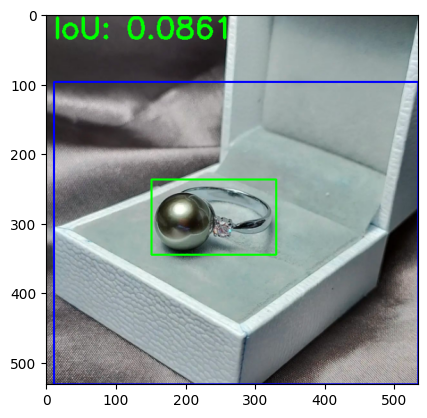

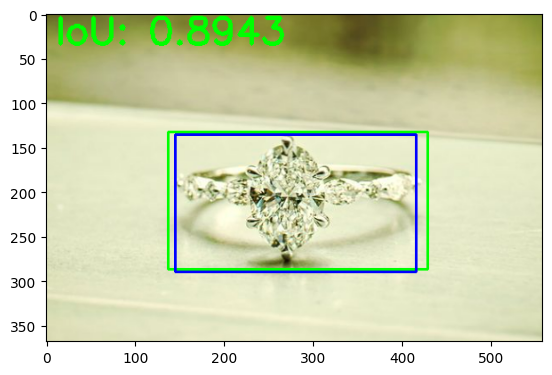

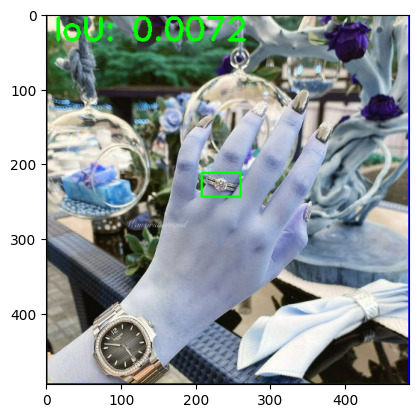

Skipping s43 due to missing files.


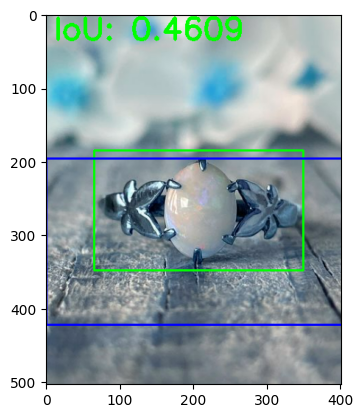

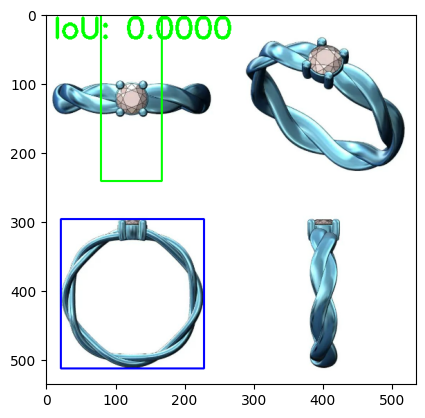

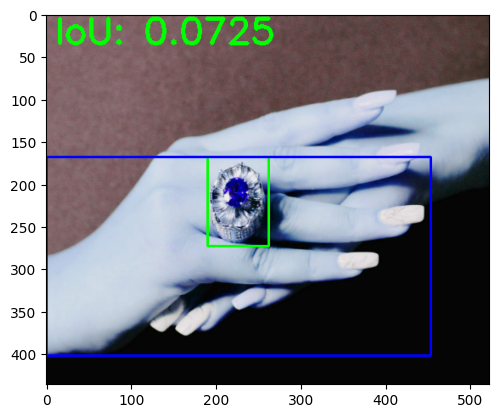

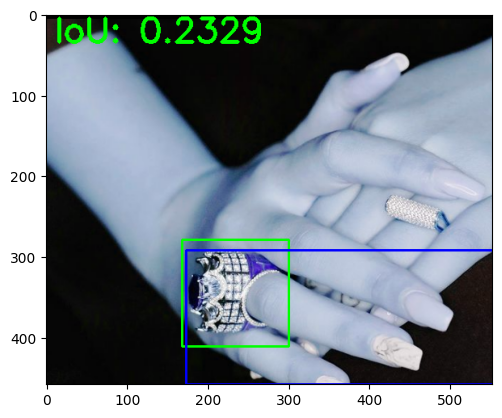

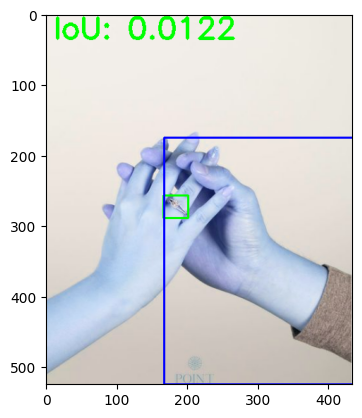

...

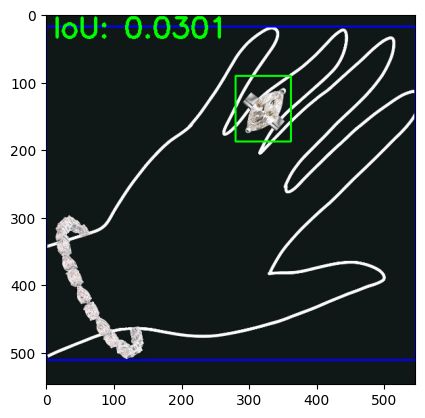

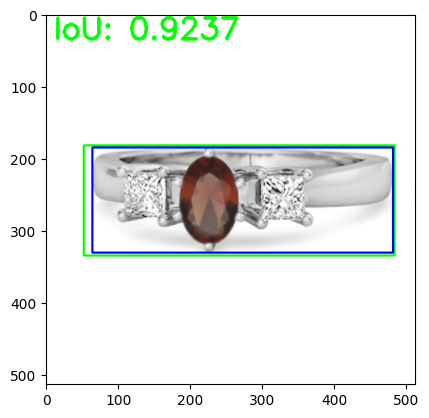

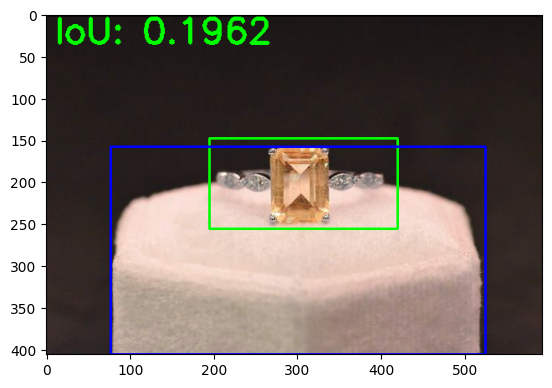

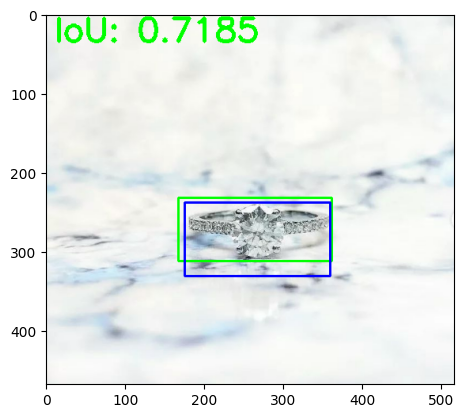

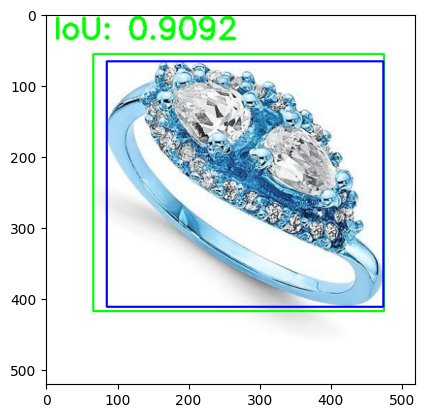

Skipping s66 due to missing files.


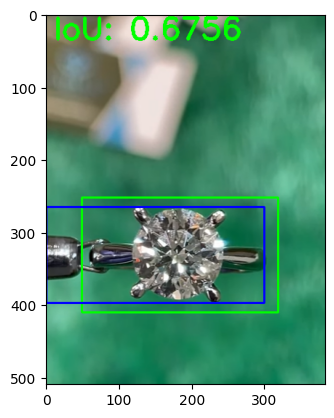

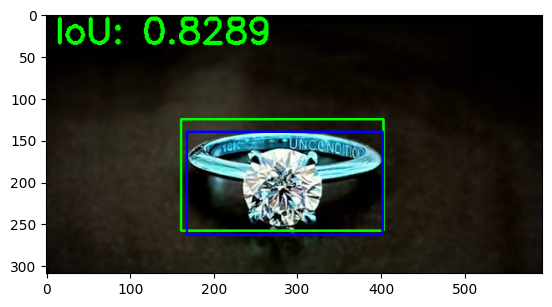

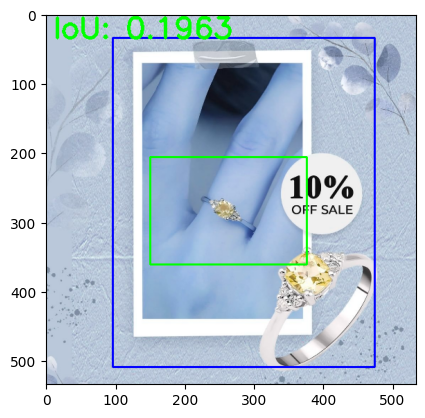

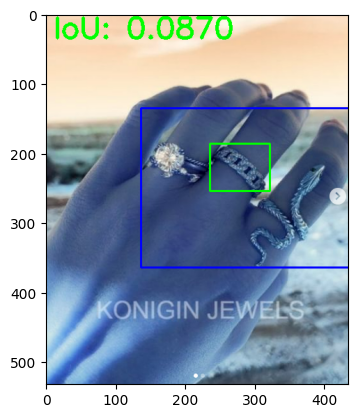

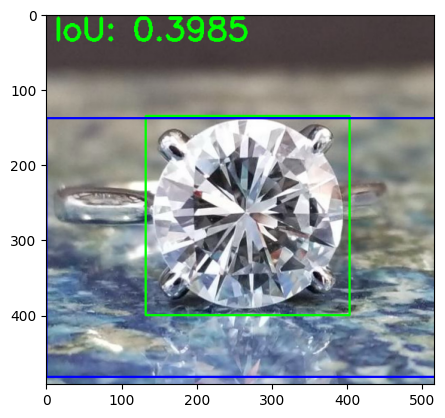

...

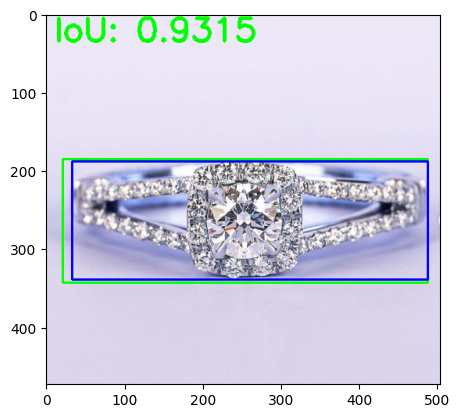

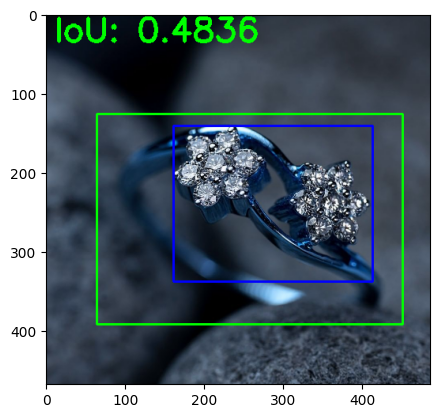

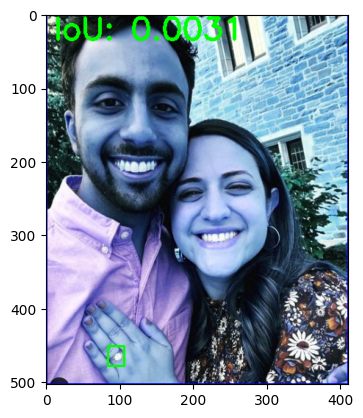

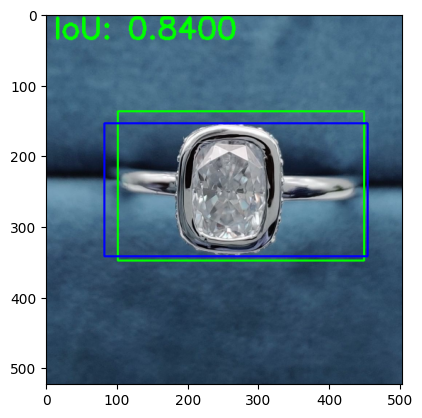

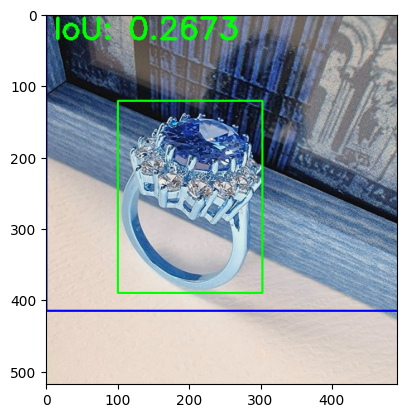

Skipping s86 due to missing files.


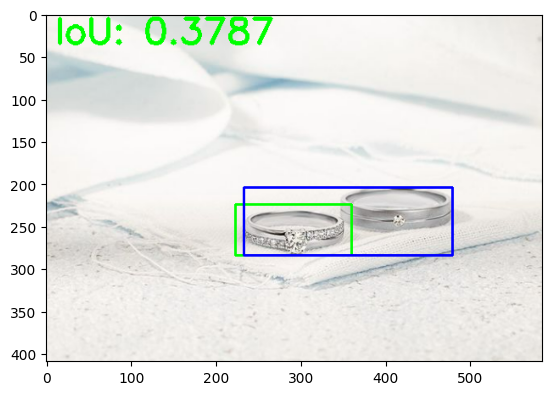

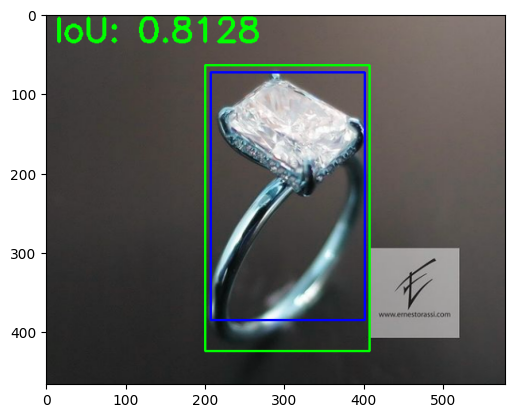

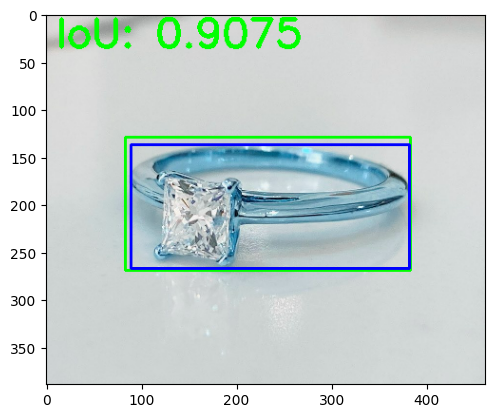

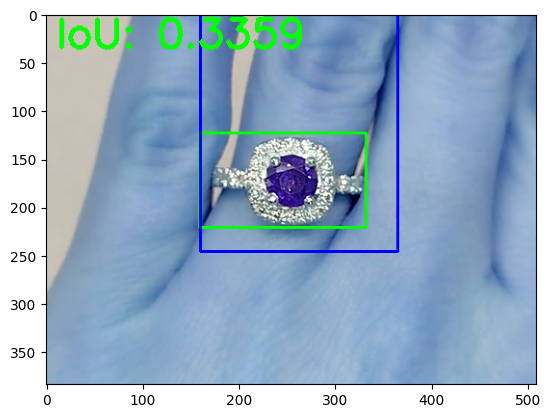

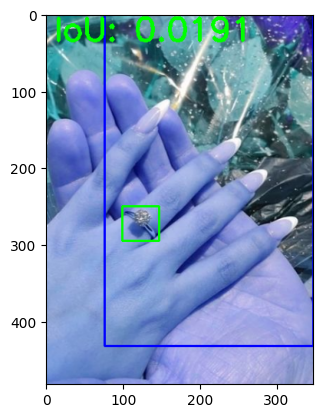

...

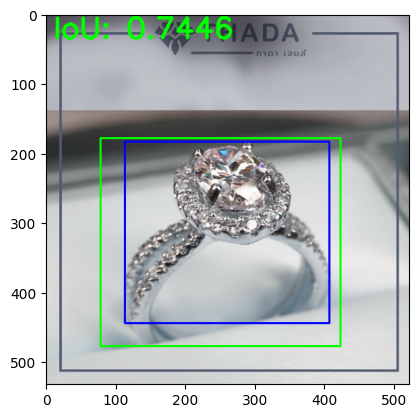

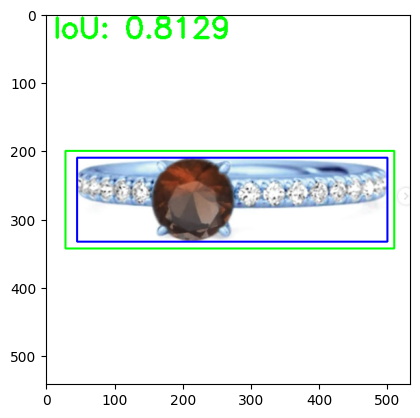

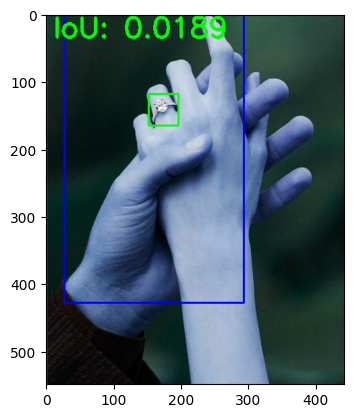

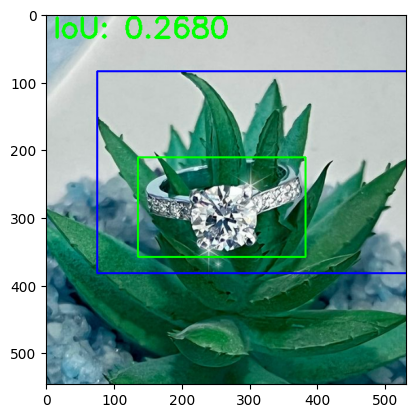

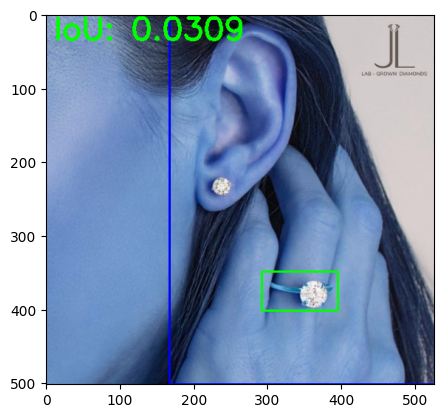

In [7]:
for i in range(1, 101):
    txt_file = f"s{i}.txt"
    img_file = f"s{i}.PNG"

    if os.path.exists(txt_file) and os.path.exists(img_file):
        compute_iou(txt_file, img_file)
        plt.show()
    else:
        print(f"Skipping s{i} due to missing files.")